### Glitch

In [1]:
# load libraries
import numpy as np
from PIL import Image
import matplotlib.image as mpimg
from matplotlib.pyplot import imshow
import os
import cv2

# import functions
from glitch import *

In [2]:
cd = os.getcwd()
print(cd)

image_path = os.path.join(cd, '01_images')
os.chdir(image_path)

/Users/stefaniemeliss/Dropbox/personal/picsNvids/glitch


In [3]:
file_name = 'venice.jpg'

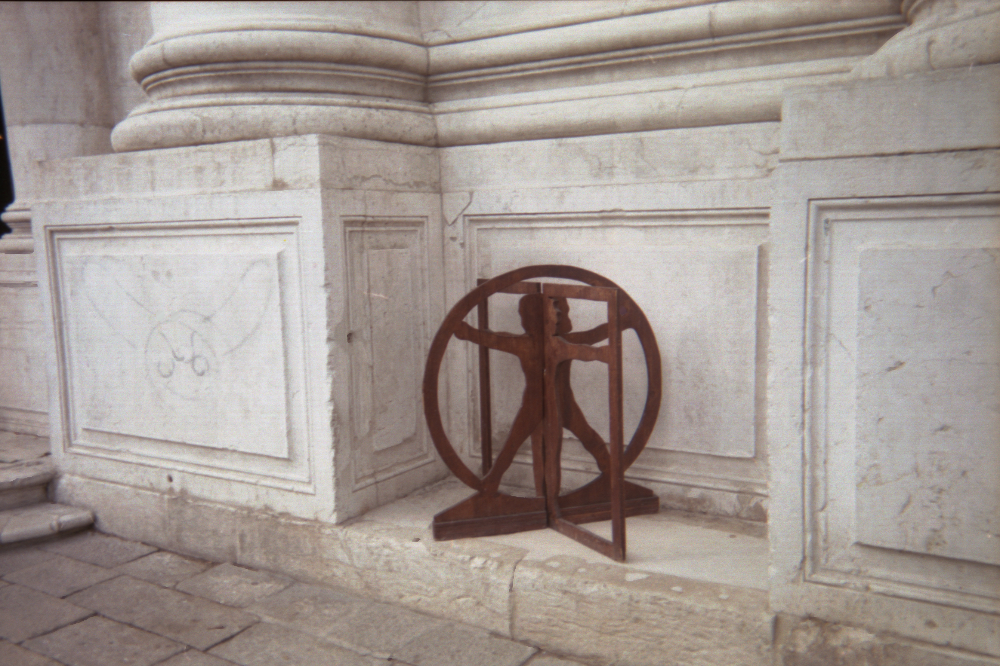

In [4]:
# load jpeg
im = Image.open(file_name)
im

In [5]:
# convert to numpy array
im_array = np.array(im)

In [6]:
im_array.shape

(2216, 3324, 3)

In [7]:
# define sequence to sample from: numbers from 0 to 100 increasing in steps of 10
dim = list(range(-100, 101, 10))
#dim = list(range(0, 101, 10))

# sample two values 600 times and save in an array
n_times = 60
n_sample = 2
shift_array = np.array([np.random.choice(dim, n_sample, replace=False) for i in range(n_times)])

In [9]:
# copy image
tmp = np.copy(im_array)

for i in range(n_times):
    
  # shift red layer
  tmp[:,:,0] = rollrep(tmp[:,:,0], shift_horizontal = shift_array[i][0], shift_vertical = shift_array[i][1])
  
  # shift green layer
  tmp[:,:,1] = rollrep(tmp[:,:,1], shift_horizontal = shift_array[i][1], shift_vertical = shift_array[i][0])

  # define output name
  outfile = file_name.replace('.jpg', '')+str(i)+'.jpg'
  
  # save image
  out = Image.fromarray(tmp)
  out.save(outfile)

In [15]:
def create_video_from_images(folder):
    video_filename = 'glitch_'+file_name.replace('.jpg', '')+'.mp4'
    valid_images = [i for i in os.listdir(folder) if i.endswith((".jpg", ".jpeg", ".png"))]
    
    #print(valid_images)
    valid_images.sort()

    first_image = cv2.imread(os.path.join(folder, valid_images[0]))
    h, w, _ = first_image.shape

    codec = cv2.VideoWriter_fourcc(*'mp4v')
    vid_writer = cv2.VideoWriter(video_filename, codec, 120, (w, h))

    for img in valid_images:
        loaded_img = cv2.imread(os.path.join(folder, img))
        for _ in range(20):
            vid_writer.write(loaded_img)

    vid_writer.release()

# Create video from resized images
create_video_from_images(image_path)